In [2]:
import os
import shutil
import stat
import seaborn as sns
import collections
import h5py
import numpy as np
import tensorflow as tf
import matplotlib.image as img
import random
import cv2
import PIL
import matplotlib.pyplot as plt
import matplotlib.image as img
from os import listdir
from os.path import isfile, join
from collections import defaultdict
from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets
from sklearn.model_selection import train_test_split
from skimage.io import imread
from keras.utils import to_categorical
from keras.applications.inception_v3 import preprocess_input
from keras.models import load_model
from shutil import copy
from shutil import copytree, rmtree
import tensorflow.keras.backend 
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras import regularizers
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.regularizers import l2
from tensorflow import keras
from tensorflow.keras import models


%cd C:\Users\teove\Documents\Faculty\Licenta\AI\content

%matplotlib inline

C:\Users\teove\Documents\Faculty\Licenta\AI\content


In [4]:
class_to_index = {}
index_to_class = {}
with open('food-101/meta/classes.txt', 'r') as file:
    class_list = [line.strip() for line in file.readlines()]
    class_to_index = {class_name: idx for idx, class_name in enumerate(class_list)}
    index_to_class = {idx: class_name for idx, class_name in enumerate(class_list)}
    class_to_index = {name: idx for idx, name in index_to_class.items()}
class_to_index_sorted = collections.OrderedDict(sorted(class_to_index.items()))
print(class_to_index_sorted)

# Method to generate directory-file map. 
def create_dir_file_mapping(path):
    directory_files = defaultdict(list)
    with open(path, 'r') as file:
        files = [i.strip() for i in file.readlines()]
        for entry in files:
            directory_name, id = entry.split('/')
            directory_files[directory_name].append(id + '.jpg')
    return directory_files

# Method to recursively copy a directory.  
def recursive_copy(source, target, symlinks = False, ignore_function = None):
    if not os.path.exists(target):
        os.makedirs(target)
        shutil.copystat(source, target)
    items = os.listdir(source)
    if ignore_function:
      exclude = ignore_function(source, items)
      items = [x for x in items if x not in exclude]
    for item in items:
        src_path = os.path.join(source, item)
        dest_path = os.path.join(target, item)
        if symlinks and os.path.islink(src_path):
            if os.path.lexists(dest_path):
                os.remove(dest_path)
            os.symlink(os.readlink(src_path), dest_path)
            try:
                st = os.lstat(src_path)
                mode = stat.S_IMODE(st.st_mode)
                os.lchmod(dest_path, mode)
            except:
                pass
        elif os.path.isdir(src_path):
            recursive_copy(src_path, dest_path, symlinks, ignore_function)
        else:
            shutil.copy2(src_path, dest_path)

# Train files to ignore. 
def ignore_training_files(d, filenames):
    subdir = os.path.basename(d)
    train_dir_files = create_dir_file_mapping('food-101/meta/train.txt')
    to_ignore = train_dir_files.get(subdir, [])
    # print(f"Ignoring in train dir {subdir}: {to_ignore}")
    return to_ignore

# Test files to ignore.    
def ignore_testing_files(d, filenames):
    subdir = os.path.basename(d)
    test_dir_files = create_dir_file_mapping('food-101/meta/test.txt')
    to_ignore = test_dir_files.get(subdir, [])
    # print(f"Ignoring in test dir {subdir}: {to_ignore}")
    return to_ignore

# Method to generate train-test files. 
def generate_train_test_split(path_to_imgs = 'food-101/images' , target_path = 'food-101'):
    recursive_copy(path_to_imgs, target_path + '/train', ignore_function=ignore_testing_files)
    recursive_copy(path_to_imgs, target_path + '/test', ignore_function=ignore_training_files)


OrderedDict([('apple_pie', 0), ('baby_back_ribs', 1), ('baklava', 2), ('beef_carpaccio', 3), ('beef_tartare', 4), ('beet_salad', 5), ('beignets', 6), ('bibimbap', 7), ('bread_pudding', 8), ('breakfast_burrito', 9), ('bruschetta', 10), ('caesar_salad', 11), ('cannoli', 12), ('caprese_salad', 13), ('carrot_cake', 14), ('ceviche', 15), ('cheese_plate', 17), ('cheesecake', 16), ('chicken_curry', 18), ('chicken_quesadilla', 19), ('chicken_wings', 20), ('chocolate_cake', 21), ('chocolate_mousse', 22), ('churros', 23), ('clam_chowder', 24), ('club_sandwich', 25), ('crab_cakes', 26), ('creme_brulee', 27), ('croque_madame', 28), ('cup_cakes', 29), ('deviled_eggs', 30), ('donuts', 31), ('dumplings', 32), ('edamame', 33), ('eggs_benedict', 34), ('escargots', 35), ('falafel', 36), ('filet_mignon', 37), ('fish_and_chips', 38), ('foie_gras', 39), ('french_fries', 40), ('french_onion_soup', 41), ('french_toast', 42), ('fried_calamari', 43), ('fried_rice', 44), ('frozen_yogurt', 45), ('garlic_bread', 

In [5]:
# Generate train-test files. 
if not os.path.isdir('food-101/test') and not os.path.isdir('food-101/train'):
    generate_train_test_split()  
    len_train = len(os.listdir('food-101/train'))
    len_test = len(os.listdir('food-101/test'))
    print(len_train,len_test)
else:
    print('train and test folders already exists.')
    len_train = len(os.listdir('food-101/train'))
    len_test = len(os.listdir('food-101/test'))
    print(len_train,len_test)

train and test folders already exists.
101 101


In [6]:
# List of all the food classes.
foods_sorted = sorted(os.listdir('food-101/images'))
foods_sorted

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito',
 'bruschetta',
 'caesar_salad',
 'cannoli',
 'caprese_salad',
 'carrot_cake',
 'ceviche',
 'cheese_plate',
 'cheesecake',
 'chicken_curry',
 'chicken_quesadilla',
 'chicken_wings',
 'chocolate_cake',
 'chocolate_mousse',
 'churros',
 'clam_chowder',
 'club_sandwich',
 'crab_cakes',
 'creme_brulee',
 'croque_madame',
 'cup_cakes',
 'deviled_eggs',
 'donuts',
 'dumplings',
 'edamame',
 'eggs_benedict',
 'escargots',
 'falafel',
 'filet_mignon',
 'fish_and_chips',
 'foie_gras',
 'french_fries',
 'french_onion_soup',
 'french_toast',
 'fried_calamari',
 'fried_rice',
 'frozen_yogurt',
 'garlic_bread',
 'gnocchi',
 'greek_salad',
 'grilled_cheese_sandwich',
 'grilled_salmon',
 'guacamole',
 'gyoza',
 'hamburger',
 'hot_and_sour_soup',
 'hot_dog',
 'huevos_rancheros',
 'hummus',
 'ice_cream',
 'lasagna',
 'lobster_bisque',
 'lobster

(384, 512, 3)


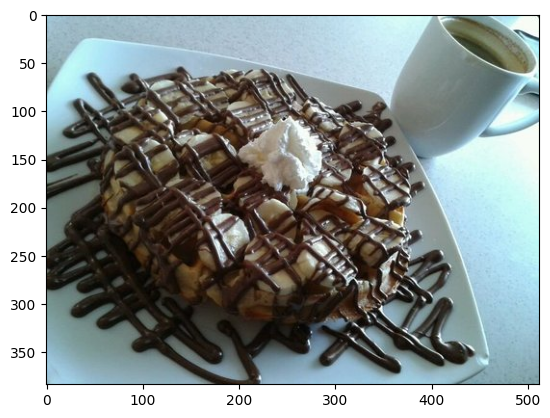

In [7]:
testImg = imread('C:/Users/teove/Documents/Faculty/Licenta/AI/content/food-101/test/waffles/1236559.jpg')
print(testImg.shape)
plt.imshow(testImg)

Fitting the data on the Inception-v3 model.

In [8]:
tensorflow.keras.backend.clear_session()

n_classes = 101
batch_size = 16
width, height = 200, 200
train_data = 'C:/Users/teove/Documents/Faculty/Licenta/AI/content/food-101/train'
test_data = 'C:/Users/teove/Documents/Faculty/Licenta/AI/content/food-101/test'
train_samples = 75750
test_samples = 25250

train_data_gen = ImageDataGenerator(rescale=1. / 255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)
test_data_gen = ImageDataGenerator(rescale=1. / 255)

train_gen = train_data_gen.flow_from_directory(train_data, target_size=(height, width), batch_size=batch_size, class_mode='categorical')

test_gen = test_data_gen.flow_from_directory(test_data, target_size=(height, width), batch_size=batch_size, class_mode='categorical')

inception = InceptionV3(weights='imagenet', include_top=False)
layer = inception.output
layer = GlobalAveragePooling2D()(layer)
layer = Dense(128,activation='relu')(layer)
layer = Dropout(0.2)(layer)

predictions = Dense(n_classes,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(layer)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(learning_rate=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='C:/Users/teove/Documents/Faculty/Licenta/AI/content/best_model_101classvardoi.keras', save_best_only=True)
csv_logger = CSVLogger('C:/Users/teove/Documents/Faculty/Licenta/AI/content/history_101classvardoi.log')

history_101class = model.fit(train_gen, steps_per_epoch= train_samples // batch_size, validation_data= test_gen, validation_steps= test_samples // batch_size, epochs=25, callbacks=[csv_logger, checkpointer])

model.save('C:/Users/teove/Documents/Faculty/Licenta/AI/content/model_trained_101classvardoi.hdf5')

Found 75750 images belonging to 101 classes.
Found 25250 images belonging to 101 classes.


In [9]:
class_map_101 = train_gen.class_indices
class_map_101

{'apple_pie': 0,
 'baby_back_ribs': 1,
 'baklava': 2,
 'beef_carpaccio': 3,
 'beef_tartare': 4,
 'beet_salad': 5,
 'beignets': 6,
 'bibimbap': 7,
 'bread_pudding': 8,
 'breakfast_burrito': 9,
 'bruschetta': 10,
 'caesar_salad': 11,
 'cannoli': 12,
 'caprese_salad': 13,
 'carrot_cake': 14,
 'ceviche': 15,
 'cheese_plate': 16,
 'cheesecake': 17,
 'chicken_curry': 18,
 'chicken_quesadilla': 19,
 'chicken_wings': 20,
 'chocolate_cake': 21,
 'chocolate_mousse': 22,
 'churros': 23,
 'clam_chowder': 24,
 'club_sandwich': 25,
 'crab_cakes': 26,
 'creme_brulee': 27,
 'croque_madame': 28,
 'cup_cakes': 29,
 'deviled_eggs': 30,
 'donuts': 31,
 'dumplings': 32,
 'edamame': 33,
 'eggs_benedict': 34,
 'escargots': 35,
 'falafel': 36,
 'filet_mignon': 37,
 'fish_and_chips': 38,
 'foie_gras': 39,
 'french_fries': 40,
 'french_onion_soup': 41,
 'french_toast': 42,
 'fried_calamari': 43,
 'fried_rice': 44,
 'frozen_yogurt': 45,
 'garlic_bread': 46,
 'gnocchi': 47,
 'greek_salad': 48,
 'grilled_cheese_sa

1579/1579 ━━━━━━━━━━━━━━━━━━━━ 823s 520ms/step
Class distribution in test dataset: Counter({0: 250, 1: 250, 2: 250, 3: 250, 4: 250, 5: 250, 6: 250, 7: 250, 8: 250, 9: 250, 10: 250, 11: 250, 12: 250, 13: 250, 14: 250, 15: 250, 16: 250, 17: 250, 18: 250, 19: 250, 20: 250, 21: 250, 22: 250, 23: 250, 24: 250, 25: 250, 26: 250, 27: 250, 28: 250, 29: 250, 30: 250, 31: 250, 32: 250, 33: 250, 34: 250, 35: 250, 36: 250, 37: 250, 38: 250, 39: 250, 40: 250, 41: 250, 42: 250, 43: 250, 44: 250, 45: 250, 46: 250, 47: 250, 48: 250, 49: 250, 50: 250, 51: 250, 52: 250, 53: 250, 54: 250, 55: 250, 56: 250, 57: 250, 58: 250, 59: 250, 60: 250, 61: 250, 62: 250, 63: 250, 64: 250, 65: 250, 66: 250, 67: 250, 68: 250, 69: 250, 70: 250, 71: 250, 72: 250, 73: 250, 74: 250, 75: 250, 76: 250, 77: 250, 78: 250, 79: 250, 80: 250, 81: 250, 82: 250, 83: 250, 84: 250, 85: 250, 86: 250, 87: 250, 88: 250, 89: 250, 90: 250, 91: 250, 92: 250, 93: 250, 94: 250, 95: 250, 96: 250, 97: 250, 98: 250, 99: 250, 100: 250})


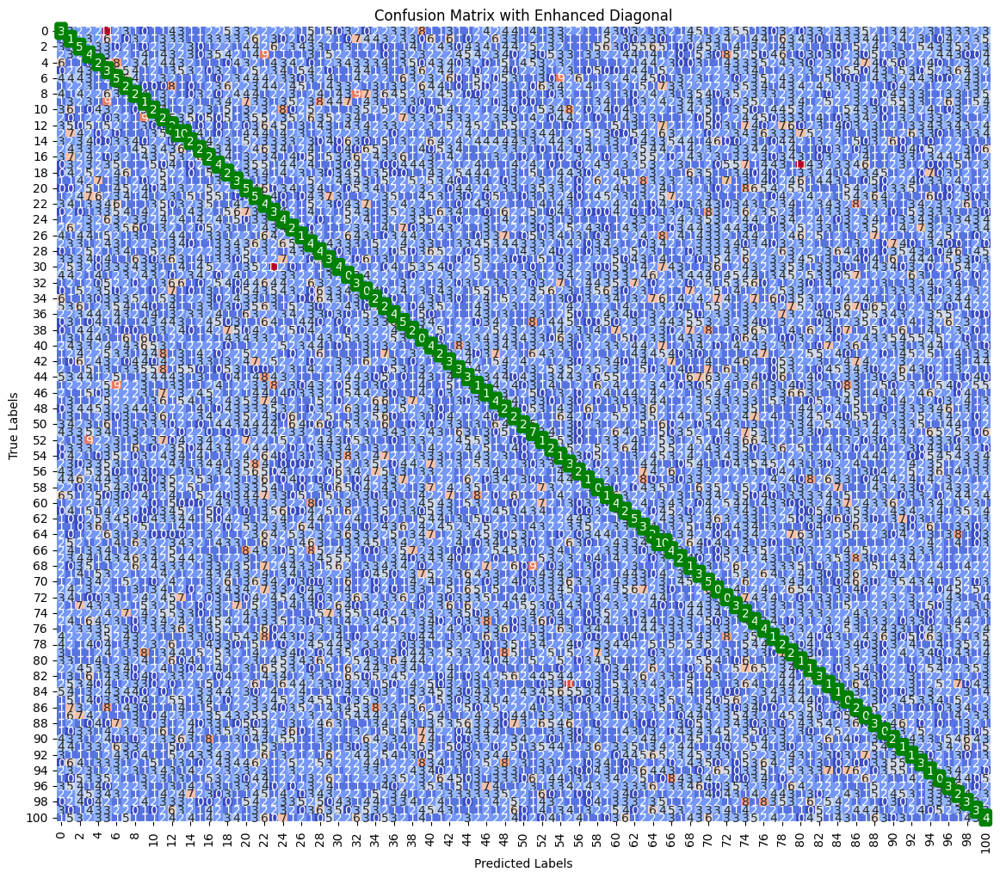

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from collections import Counter

model = load_model('C:/Users/teove/Documents/Faculty/Licenta/AI/content/model_trained_101classvardoi.hdf5')

test_pred = model.predict(test_gen, steps=test_samples // batch_size + 1)

test_pred_classes = np.argmax(test_pred, axis=1)

test_true_classes = test_gen.classes

conf_matrix = confusion_matrix(test_true_classes, test_pred_classes)

class_counts = Counter(test_true_classes)
print("Class distribution in test dataset:", class_counts)

plt.figure(figsize=(14, 12))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='coolwarm', cbar=False)

for i in range(len(conf_matrix)):
    plt.text(i + 0.5, i + 0.5, conf_matrix[i, i], color='white', ha='center', va='center', 
             bbox=dict(facecolor='green', edgecolor='green', boxstyle='round,pad=0.2'))

plt.title('Confusion Matrix with Enhanced Diagonal')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

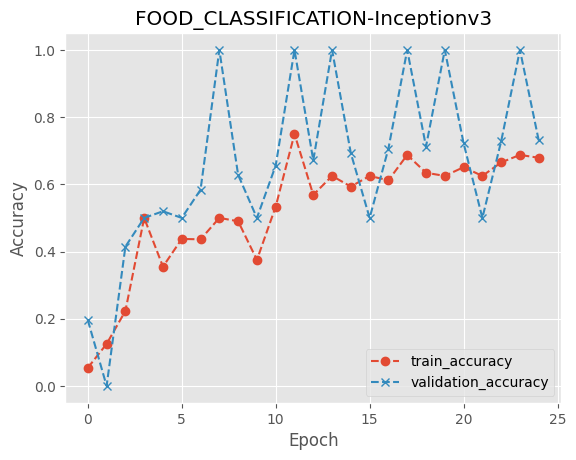

In [8]:
# Plot training-accuracy & validation-accuracy.
import seaborn as sns
_ = plt.style.use('ggplot')
_ = plt.title('FOOD_CLASSIFICATION-Inceptionv3')
_ = plt.plot(history_101class.history['accuracy'], marker='o', linestyle='dashed')
_ = plt.plot(history_101class.history['val_accuracy'], marker='x', linestyle='dashed')
_ = plt.ylabel('Accuracy')
_ = plt.xlabel('Epoch')
_ = plt.legend(['train_accuracy', 'validation_accuracy'], loc='best')
plt.show()

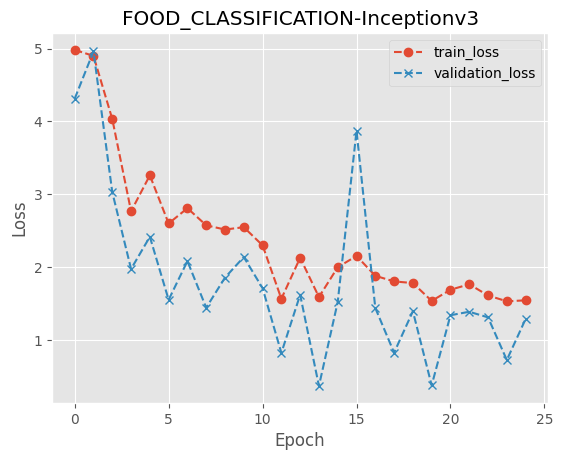

In [9]:
# Plot training-loss & validation-loss.
_ = plt.style.use('ggplot')
_ = plt.title('FOOD_CLASSIFICATION-Inceptionv3')
_ = plt.plot(history_101class.history['loss'], marker='o', linestyle='dashed')
_ = plt.plot(history_101class.history['val_loss'], marker='x', linestyle='dashed')
_ = plt.ylabel('Loss')
_ = plt.xlabel('Epoch')
_ = plt.legend(['train_loss', 'validation_loss'], loc='best')
plt.show()

In [6]:
# Loading the best saved model to make predictions.
tensorflow.keras.backend.clear_session()
model_best = load_model('best_model_101classvardoi.keras',compile = False)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


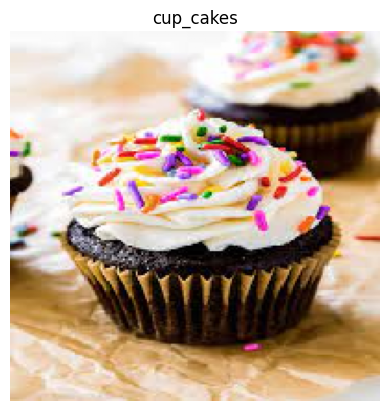

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


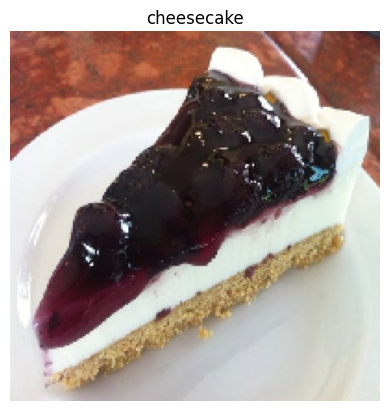

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step


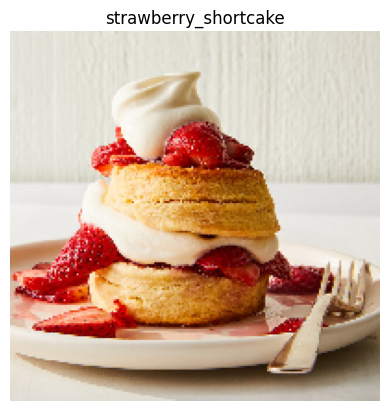

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step


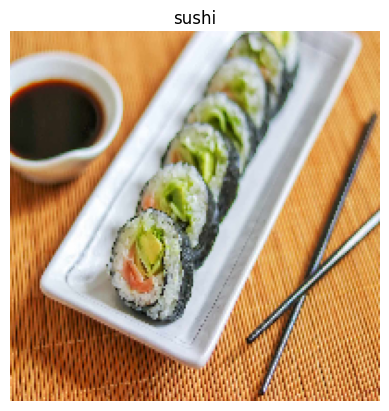

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step


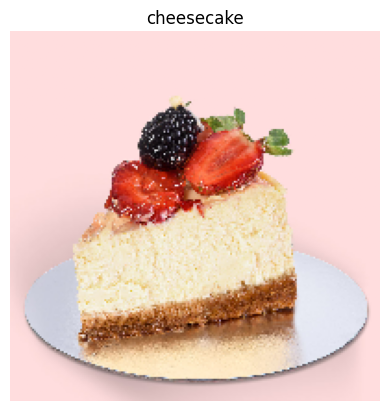

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step


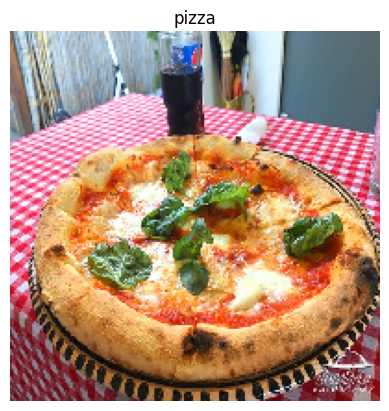

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step


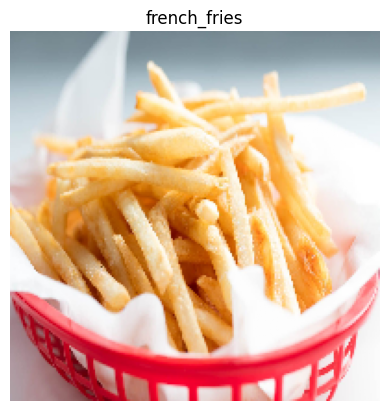

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step


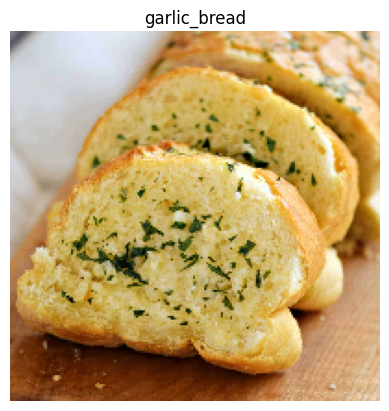

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step


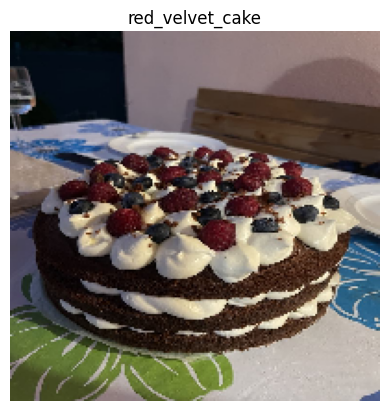

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step


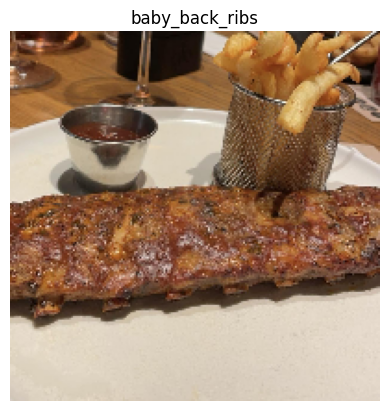

In [7]:
def predict_class(model, images, show=True):
    for img_path in images:
        img = image.load_img(img_path, target_size=(200, 200))
        img = image.img_to_array(img)                    
        img = np.expand_dims(img, axis=0)         
        img = img / 255.                                      

        pred = model.predict(img)
        index = np.argmax(pred)
        foods_sorted.sort()
        pred_value = foods_sorted[index]
        if show:
            # plt.figure(figsize=figsize)  # Set the figure size here
            plt.imshow(img[0])                           
            plt.axis('off')
            plt.title(pred_value)
            plt.show()

images = ['C:/Users/teove/Documents/Faculty/Licenta/AI/cupcake.jpeg','C:/Users/teove/Documents/Faculty/Licenta/AI/818687.jpg','C:/Users/teove/Documents/Faculty/Licenta/AI/strawberry.jpg', 'C:/Users/teove/Downloads/sushi.jpg', 'C:/Users/teove/Downloads/Felie-Cheesecake.jpg', 'C:/Users/teove/Documents/Faculty/Licenta/AI/pizza3.jpg', 'C:/Users/teove/Documents/Faculty/Licenta/AI/frenchfries.jpg', 'C:/Users/teove/Documents/Faculty/Licenta/AI/garlicbread.jpg', 'C:/Users/teove/Downloads/tort_ziua_mea.jpg', 'C:/Users/teove/Downloads/6beafb25-02d2-42fe-afa6-820c273920b6.jpg']
predict_class(model_best, images, True)

In [20]:
def get_activations(img_path, model_activations):
    img = image.load_img(img_path, target_size=(200, 200))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img /= 255.
    return model_activations.predict(img)

def visualize_activations(activations, layer_names):
    images_per_row = 16

    for layer_name, activation_map in zip(layer_names, activations):
        n_feats = activation_map.shape[-1]
        size = activation_map.shape[1]
        num_columns = n_feats // images_per_row
        show_grid = np.zeros((size * num_columns, images_per_row * size))

        for col in range(num_columns):
            for row in range(images_per_row):
                channel_img = activation_map[0, :, :, col * images_per_row + row]
                channel_img -= channel_img.mean()
                channel_img /= (channel_img.std() + 1e-5)
                channel_img *= 64
                channel_img += 128
                channel_img = np.clip(channel_img, 0, 255).astype('uint8')
                show_grid[col * size: (col + 1) * size, row * size: (row + 1) * size] = channel_img

        scale = 1. / size
        plt.figure(figsize=(scale * show_grid.shape[1], scale * show_grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(show_grid, aspect='auto', cmap='viridis')

    plt.show()


def get_attribution(food):
    img = image.load_img(food, target_size=(200, 200))
    img = image.img_to_array(img)
    img = img / 255.0
    f, ax = plt.subplots(1, 3, figsize=(15, 15))
    ax[0].imshow(img)
    
    img = np.expand_dims(img, axis=0)
    preds = model.predict(img)
    class_id = np.argmax(preds[0])
    ax[0].set_title("Image")
    
    last_conv_layer = model.get_layer("mixed10")
    heatmap_model = Model(inputs=model.input, outputs=[last_conv_layer.output, model.output])
    
    with tf.GradientTape() as tape:
        conv_output, predictions = heatmap_model(img)
        loss = predictions[:, class_id]
    
    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    conv_output = conv_output[0]
    heatmap = tf.reduce_mean(tf.multiply(pooled_grads, conv_output), axis=-1)
    
    heatmap = np.maximum(heatmap, 0)
    heatmap /= tf.reduce_max(heatmap)
    ax[1].imshow(heatmap.numpy())
    ax[1].set_title("Heatmap")
    
    act_img = cv2.imread(food)
    heatmap = cv2.resize(heatmap.numpy(), (act_img.shape[1], act_img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(act_img, 0.7, heatmap, 0.3, 0)
    cv2.imwrite('classactivation.png', superimposed)
    img_act = image.load_img('classactivation.png', target_size=(200, 200))
    ax[2].imshow(img_act)
    ax[2].set_title("Class Activation Map")
    plt.show()
    return preds

In [21]:
tensorflow.keras.backend.clear_session()
print("Loading the model..")
model = load_model('best_model_101classvardoi.keras',compile = False)
# Get model layers
layers = [layer.output for layer in model.layers[1:11]]
layer_names = [layer.name for layer in model.layers[1:11]]

activations_output = models.Model(inputs=model.input, outputs=layers)

print(layer_names)
print(len(model.layers))

Loading the model..
['conv2d', 'batch_normalization', 'activation', 'conv2d_1', 'batch_normalization_1', 'activation_1', 'conv2d_2', 'batch_normalization_2', 'activation_2', 'max_pooling2d']
315


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


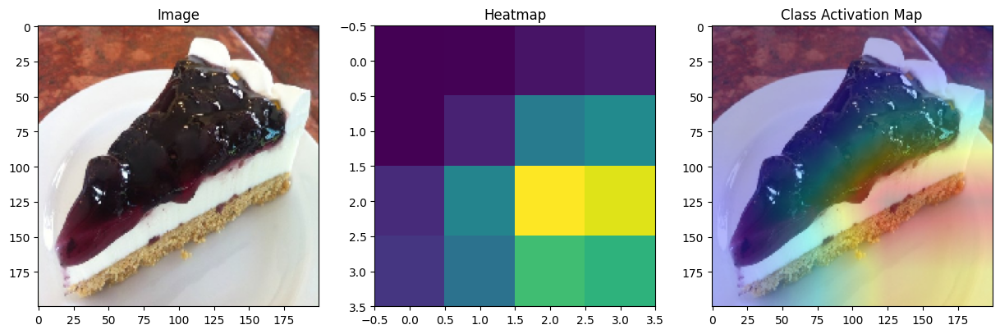

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step


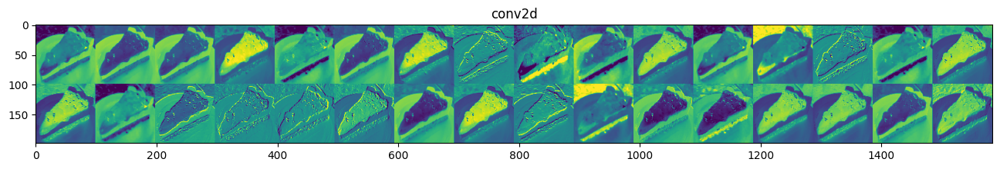

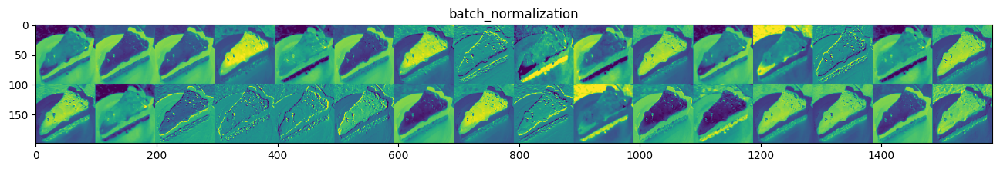

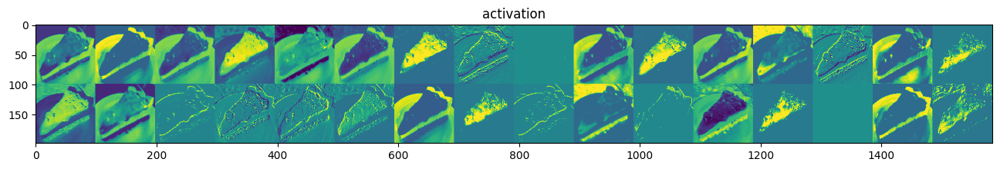

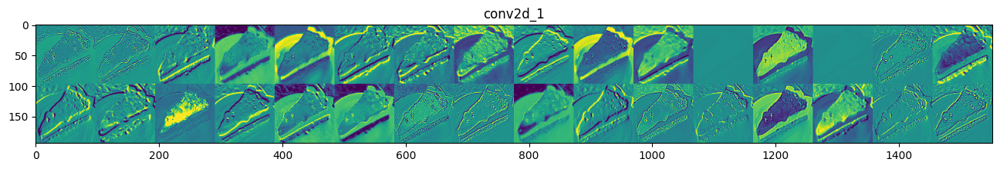

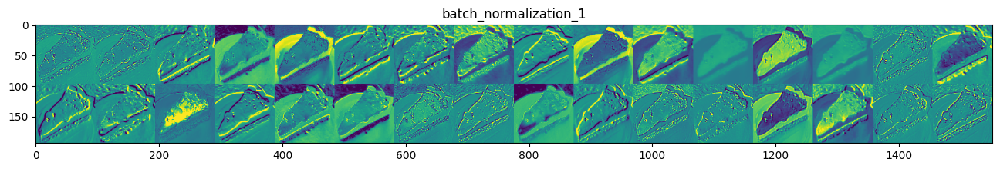

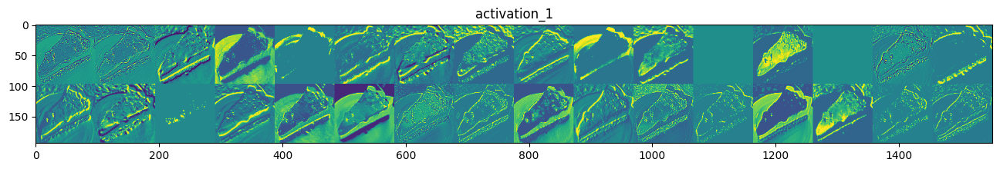

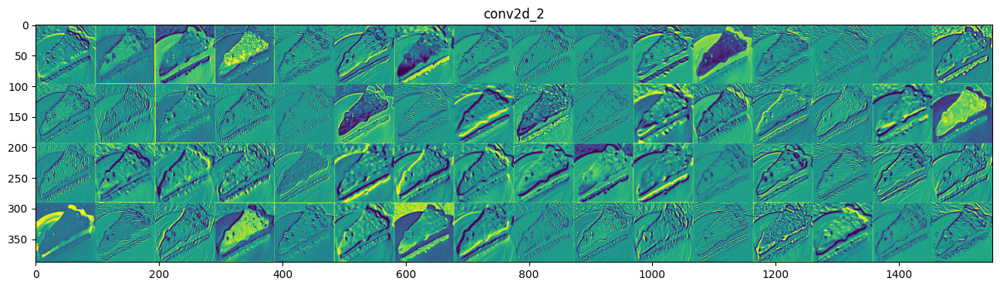

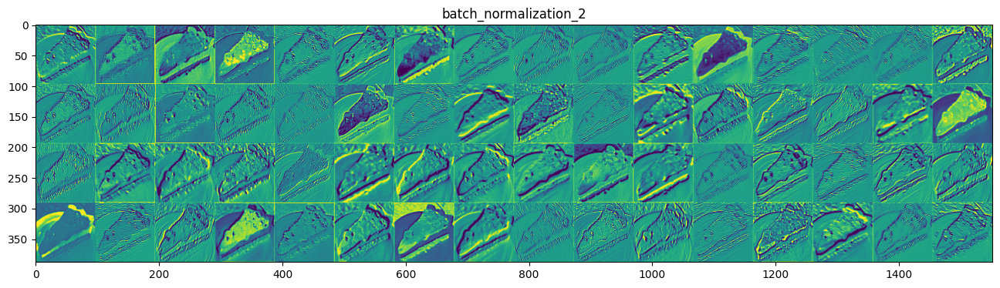

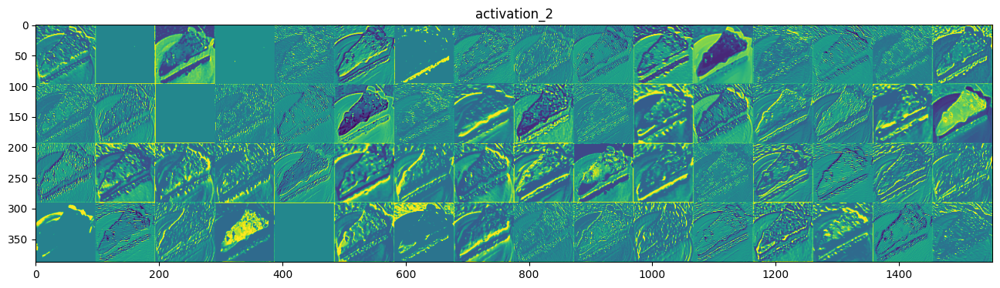

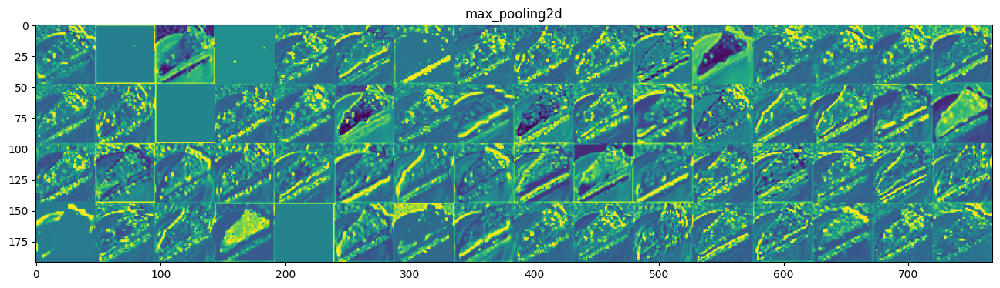

In [22]:
# Get attributions
get_attribution('C:/Users/teove/Documents/Faculty/Licenta/AI/818687.jpg')
# Show activation layers
visualize_activations(get_activations('C:/Users/teove/Documents/Faculty/Licenta/AI/818687.jpg',activations_output), layer_names)